### pycocotools를 이용한 COCO 데이터 액세스와 Segmentation Masking 시각화
* pycocotools 사용부분은 https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocoDemo.ipynb 를 참조하였음.
* pycocotools를 활용하여 coco dataset을 탐색
* pycocotools는 colab에서 이미 설치됨.
* pycocotools 설치는 pip로 설치 시 오류가 발생하기 쉬우므로 conda 로 설치하거나 아예 git에서 소스코드를 다운로드 받아서 설치.


In [1]:
from pycocotools.coco import COCO
import numpy as np

### COCO 데이터 세트 Annotation 다운로드
1. COCO 데이터 세트는 아래에서 다운로드 가능
http://cocodataset.org/#download

2. 2017 Train/Val annotation 압축 파일을 다운로드 한 뒤, /content/data에 압축 해제  
2017년 Train image 파일 다운로드: wget http://images.cocodataset.org/zips/train2017.zip  
2017년 Val image 파일 다운로드: wget http://images.cocodataset.org/zips/val2017.zip  
2017년 Train/Val annoation 파일 다운로드: http://images.cocodataset.org/annotations/annotations_trainval2017.zip  


In [2]:
!mkdir -p /content/data

In [3]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip annotations_trainval2017.zip -d /content/data

--2023-11-18 08:32:02--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.117.241, 52.217.90.156, 52.217.106.180, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.117.241|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  59.6MB/s    in 4.5s    

2023-11-18 08:32:07 (53.4 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

Archive:  annotations_trainval2017.zip
  inflating: /content/data/annotations/instances_train2017.json  
  inflating: /content/data/annotations/instances_val2017.json  
  inflating: /content/data/annotations/captions_train2017.json  
  inflating: /content/data/annotations/captions_val2017.json  
  inflating: /content/data/annotations/person_keypoints_train2017.json  
  inflating: /conte

### COCO Annotation 정보 확인하기

In [4]:
dataDir='/content/data'
dataType='val2017'
annFile='{}/annotations/instances_{}.json'.format(dataDir,dataType)
print(annFile)

/content/data/annotations/instances_val2017.json


In [5]:
!ls -lia /content/data/annotations/instances_val2017.json

3276867 -rw-rw-r-- 1 root root 19987840 Sep  1  2017 /content/data/annotations/instances_val2017.json


In [ ]:
!sudo apt-get install jq

In [7]:
!jq . /content/data/annotations/instances_val2017.json > output.json

In [14]:
!head -20 output.json

{
  "info": {
    "description": "COCO 2017 Dataset",
    "url": "http://cocodataset.org",
    "version": "1.0",
    "year": 2017,
    "contributor": "COCO Consortium",
    "date_created": "2017/09/01"
  },
  "licenses": [
    {
      "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/",
      "id": 1,
      "name": "Attribution-NonCommercial-ShareAlike License"
    },
    {
      "url": "http://creativecommons.org/licenses/by-nc/2.0/",
      "id": 2,
      "name": "Attribution-NonCommercial License"
    },


In [13]:
!tail -20 output.json

      "id": 87,
      "name": "scissors"
    },
    {
      "supercategory": "indoor",
      "id": 88,
      "name": "teddy bear"
    },
    {
      "supercategory": "indoor",
      "id": 89,
      "name": "hair drier"
    },
    {
      "supercategory": "indoor",
      "id": 90,
      "name": "toothbrush"
    }
  ]
}


In [15]:
!grep -n 'annotations' output.json

50054:  "annotations": [


In [23]:
!head -50300 output.json | tail -200

          396.35,
          478.48,
          395.93,
          476.68,
          396.03,
          475.4,
          396.77,
          473.92,
          398.79,
          473.28,
          399.96,
          473.49,
          401.87,
          474.56,
          403.47,
          473.07,
          405.59,
          473.39,
          407.71,
          476.68,
          409.41,
          479.23,
          409.73,
          481.56,
          410.69,
          480.4,
          411.85,
          481.35,
          414.93,
          479.86,
          418.65,
          477.32,
          420.03,
          476.04,
          422.58,
          479.02,
          422.58,
          480.29,
          423.01,
          483.79,
          419.93,
          486.66,
          416.21,
          490.06,
          415.57,
          492.18,
          416.85,
          491.65,
          420.24,
          492.82,
          422.9,
          493.56,
          424.39,
          496.43,
          424.6,
          498.

### COCO API를 활용하기 위해 annotation 파일을 COCO 객체로 로드하기

In [24]:
# annotation 파일을 COCO객체로 로드하면 다양한 COCO객체의 API들을 이용하여 COCO DATASET 활용 가능
from pycocotools.coco import COCO

coco=COCO(annFile)

loading annotations into memory...
Done (t=0.48s)
creating index...
index created!


#### Cagory 정보를 가져 오기

In [25]:
# getCatIds()는 COCO Dataset의 category id를 리스트로 반환
print(coco.getCatIds())

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90]


In [26]:
# loadCats()는 category id 리스트를 입력받아 category들에 대한 세부 정보를 여러개의 딕셔너리를 개별 원소를 가지는 리스트로 반환
cats = coco.loadCats(coco.getCatIds())
cats

[{'supercategory': 'person', 'id': 1, 'name': 'person'},
 {'supercategory': 'vehicle', 'id': 2, 'name': 'bicycle'},
 {'supercategory': 'vehicle', 'id': 3, 'name': 'car'},
 {'supercategory': 'vehicle', 'id': 4, 'name': 'motorcycle'},
 {'supercategory': 'vehicle', 'id': 5, 'name': 'airplane'},
 {'supercategory': 'vehicle', 'id': 6, 'name': 'bus'},
 {'supercategory': 'vehicle', 'id': 7, 'name': 'train'},
 {'supercategory': 'vehicle', 'id': 8, 'name': 'truck'},
 {'supercategory': 'vehicle', 'id': 9, 'name': 'boat'},
 {'supercategory': 'outdoor', 'id': 10, 'name': 'traffic light'},
 {'supercategory': 'outdoor', 'id': 11, 'name': 'fire hydrant'},
 {'supercategory': 'outdoor', 'id': 13, 'name': 'stop sign'},
 {'supercategory': 'outdoor', 'id': 14, 'name': 'parking meter'},
 {'supercategory': 'outdoor', 'id': 15, 'name': 'bench'},
 {'supercategory': 'animal', 'id': 16, 'name': 'bird'},
 {'supercategory': 'animal', 'id': 17, 'name': 'cat'},
 {'supercategory': 'animal', 'id': 18, 'name': 'dog'},

In [27]:
# COCO Category와 Super Category 출력
nms=[cat['name'] for cat in cats]
print('COCO categories: \n{}\n'.format(' '.join(nms)))

nms = set([cat['supercategory'] for cat in cats])
print('COCO supercategories: \n{}'.format(' '.join(nms)))

COCO categories: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush

COCO supercategories: 
outdoor kitchen furniture electronic accessory appliance food indoor animal vehicle person sports


### 지정된 이미지를 데이터 세트에서 로드하기

In [28]:
catIds = coco.getCatIds(catNms=['person','dog','skateboard']);
print(catIds)
# oco.getImgIds(catIds=catIds)는 해당 catogory id별로 한개의 image id을 임의로 출력
imgIds = coco.getImgIds(catIds=catIds)
print(imgIds)

[1, 18, 41]
[549220, 324158, 279278]


In [29]:
#loadImgs()는 인자로 들어온 image id에 대한 메타 정보를 딕셔너리를 개별 원소로 가지는 리스트로 반환
img = coco.loadImgs(324158)
print(img)

# 전체 리스트는 필요 없고 내부 딕셔너리만 필요하므로 [0]으로 내부 딕셔너리 추출
print("\n내부 딕셔너리 파일 메타정보 추출")
img = coco.loadImgs(324158)[0]
print(img)

[{'license': 1, 'file_name': '000000324158.jpg', 'coco_url': 'http://images.cocodataset.org/val2017/000000324158.jpg', 'height': 334, 'width': 500, 'date_captured': '2013-11-19 23:54:06', 'flickr_url': 'http://farm1.staticflickr.com/169/417836491_5bf8762150_z.jpg', 'id': 324158}]

내부 딕셔너리 파일 메타정보 추출
{'license': 1, 'file_name': '000000324158.jpg', 'coco_url': 'http://images.cocodataset.org/val2017/000000324158.jpg', 'height': 334, 'width': 500, 'date_captured': '2013-11-19 23:54:06', 'flickr_url': 'http://farm1.staticflickr.com/169/417836491_5bf8762150_z.jpg', 'id': 324158}


#### COCO 이미지를 다운로드 후 시각화

In [30]:
coco_url = img['coco_url']
print(coco_url)

http://images.cocodataset.org/val2017/000000324158.jpg


In [32]:
import urllib.request

# url로 있는 이미지 다운로드
def download_image(url, target_path):
  urllib.request.urlretrieve(url, target_path)

download_image(img['coco_url'], '/content/data/' + img['file_name'])

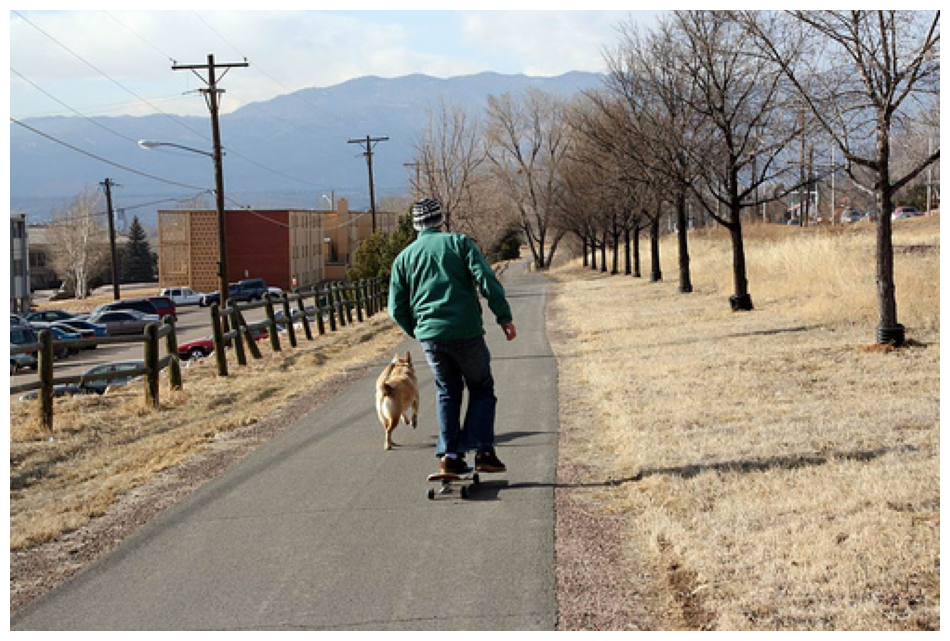

In [33]:
import cv2
import matplotlib.pyplot as plt
import pylab
%matplotlib inline

file_path = '/content/data/' + img['file_name']

image_array = cv2.imread(file_path)
image_array = cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 14))
plt.axis('off')
plt.imshow(image_array)
plt.show()

### Instance Segmentation 시각화 - COCO API 활용한 시각화
* getAnnIds()로 특정 image에 해당하는 annotation id를 가져온 후에 이 id를 loadAnns()로 입력하여 해당 이미지의 모든 annotation 정보를 가져옴.
* segmentation 정보는 polygon 형태로 되어 있음.
* annotation 정보를 coco.showAnns(anns)에 입력하여 instance segmentation 시각화 수행.

In [34]:
# 해당 image의 annotation을 가져오기 위해서 getAnnIds() 를 이용함. 인자로 image의 id(파일명이 아님)와 category id를 입력
# 하나의 image는 segmentation별로 여러개의 annotation을 가질 수 있음
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
annIds # annotations id

[10673, 638724, 2162813]

In [35]:
# loadAnns()에 annotation id를 리스트로 입력하면 annotation 정보들을 반환함.
anns = coco.loadAnns(annIds)
anns

[{'segmentation': [[216.7,
    211.89,
    216.16,
    217.81,
    215.89,
    220.77,
    215.89,
    223.73,
    217.77,
    225.35,
    219.12,
    224.54,
    219.12,
    220.5,
    219.66,
    217.27,
    219.93,
    212.7,
    220.46,
    207.85,
    219.66,
    203.01,
    218.85,
    198.43,
    217.77,
    195.74,
    216.7,
    194.93,
    215.62,
    190.62,
    215.62,
    186.59,
    214.27,
    183.89,
    211.85,
    184.16,
    211.85,
    187.66,
    210.24,
    187.66,
    209.16,
    184.97,
    207.81,
    183.36,
    205.12,
    186.59,
    205.12,
    189.28,
    201.08,
    192.78,
    199.74,
    195.2,
    196.78,
    200.04,
    196.51,
    203.01,
    198.12,
    205.43,
    197.32,
    209.2,
    196.78,
    213.23,
    197.05,
    218.89,
    199.74,
    221.85,
    201.62,
    225.35,
    201.62,
    233.69,
    201.08,
    236.11,
    202.97,
    236.38,
    204.85,
    236.11,
    204.58,
    232.34,
    203.78,
    228.85,
    205.39,
    233.15,
    20

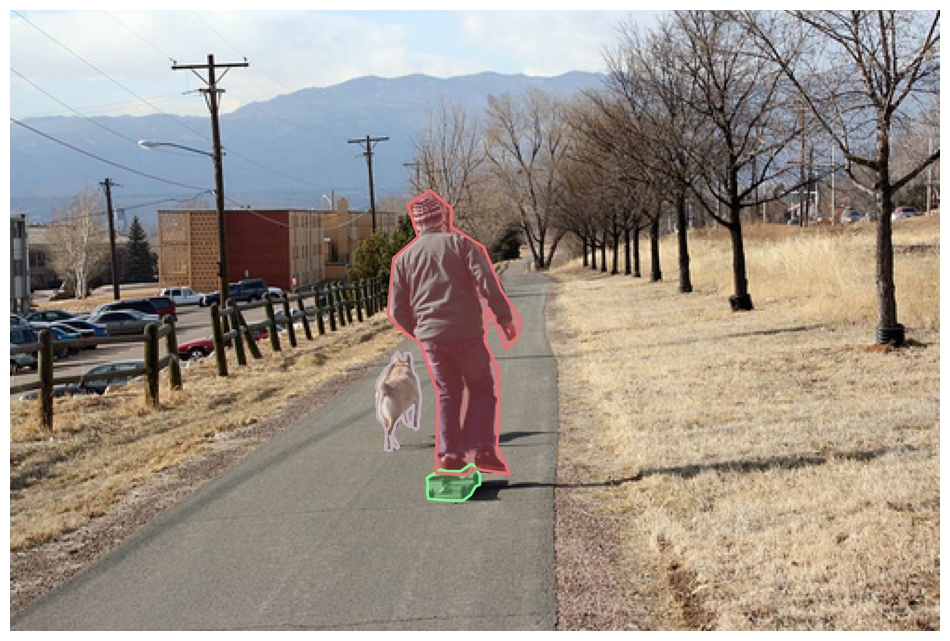

In [36]:
# showAnns( )는 annotation 정보들을 입력 받아서 Visualization 시켜줌. 단 먼저 matplotlib 객체로 원본 이미지가 먼저 로드되어 있어야 함.
plt.figure(figsize=(12, 14))
plt.imshow(image_array)
plt.axis('off')

coco.showAnns(anns)

### Polygon Annotation 정보를 이용하여 Instance Segmentation 시각화
* Polygon 정보를 직접 추출하여 이를 시각화
* polygon 정보를 coco API를 활용하여 masking 형태로 변환 후 해당 masking을 원본 이미지에 적용하여 시각화.  

In [37]:
len(anns), type(anns[0])

(3, dict)

In [38]:
# 앞에서 추출한 annotations 정보를 가지는 anns list의 의 3번째 값(인덱스 2)에서 segmentation polygon 값만 추출
# 사람의 정보
print(anns[2]['segmentation']) # xy가 연달아 있는 구조
ann_2_seg = anns[2]['segmentation'][0]
print(type(ann_2_seg), len(ann_2_seg))
print(ann_2_seg)

[[228.43, 247.9, 229.63, 206.62, 224.24, 191.07, 220.65, 179.7, 207.49, 169.53, 202.71, 163.55, 205.7, 133.04, 218.86, 121.68, 213.47, 104.33, 225.44, 96.55, 236.8, 106.12, 236.8, 116.29, 254.15, 127.06, 263.72, 150.39, 274.49, 166.54, 271.5, 177.31, 266.12, 181.5, 257.14, 159.96, 254.75, 177.91, 261.93, 192.27, 262.53, 216.79, 261.33, 234.14, 268.51, 249.1, 247.57, 246.11, 245.78, 249.69, 229.03, 248.5]]
<class 'list'> 52
[228.43, 247.9, 229.63, 206.62, 224.24, 191.07, 220.65, 179.7, 207.49, 169.53, 202.71, 163.55, 205.7, 133.04, 218.86, 121.68, 213.47, 104.33, 225.44, 96.55, 236.8, 106.12, 236.8, 116.29, 254.15, 127.06, 263.72, 150.39, 274.49, 166.54, 271.5, 177.31, 266.12, 181.5, 257.14, 159.96, 254.75, 177.91, 261.93, 192.27, 262.53, 216.79, 261.33, 234.14, 268.51, 249.1, 247.57, 246.11, 245.78, 249.69, 229.03, 248.5]


In [39]:
 # x,y 좌표값이 연이어 되어 있는 list형 polygon segmentation 정보를 x,y 쌍 형태로 변환.
 polygon_x = [x for index, x in enumerate(ann_2_seg) if index % 2 == 0]
 polygon_y = [x for index, x in enumerate(ann_2_seg) if index % 2 == 1]
 print('polygon_x:', polygon_x)
 print('polygon_y:', polygon_y)
 polygon_xy = [[x, y] for x, y in zip(polygon_x, polygon_y)]
 print('polygon_xy:', polygon_xy)

polygon_x: [228.43, 229.63, 224.24, 220.65, 207.49, 202.71, 205.7, 218.86, 213.47, 225.44, 236.8, 236.8, 254.15, 263.72, 274.49, 271.5, 266.12, 257.14, 254.75, 261.93, 262.53, 261.33, 268.51, 247.57, 245.78, 229.03]
polygon_y: [247.9, 206.62, 191.07, 179.7, 169.53, 163.55, 133.04, 121.68, 104.33, 96.55, 106.12, 116.29, 127.06, 150.39, 166.54, 177.31, 181.5, 159.96, 177.91, 192.27, 216.79, 234.14, 249.1, 246.11, 249.69, 248.5]
polygon_xy: [[228.43, 247.9], [229.63, 206.62], [224.24, 191.07], [220.65, 179.7], [207.49, 169.53], [202.71, 163.55], [205.7, 133.04], [218.86, 121.68], [213.47, 104.33], [225.44, 96.55], [236.8, 106.12], [236.8, 116.29], [254.15, 127.06], [263.72, 150.39], [274.49, 166.54], [271.5, 177.31], [266.12, 181.5], [257.14, 159.96], [254.75, 177.91], [261.93, 192.27], [262.53, 216.79], [261.33, 234.14], [268.51, 249.1], [247.57, 246.11], [245.78, 249.69], [229.03, 248.5]]


(-0.5, 499.5, 333.5, -0.5)

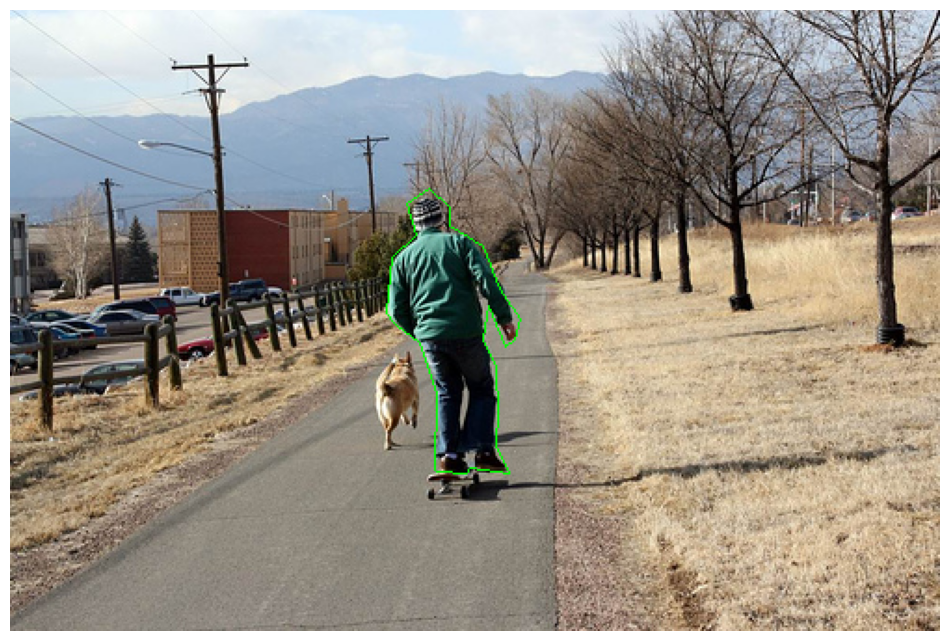

In [40]:
import numpy as np

# opencv의 polylines를 이용하여 변환된 polygon 좌표 적용하여 instance segmentation 외곽선 시각화
green_color = (0, 255, 0)

draw_img = image_array.copy()
polygon_xy = np.array(polygon_xy, np.int32) # numpy array로 만들고
draw_img = cv2.polylines(draw_img, [polygon_xy], True, (0, 255, 0)) # ndarray를 리스트로 감싸야함

plt.figure(figsize=(12, 14))
plt.imshow(draw_img)
plt.axis('off')

(-0.5, 499.5, 333.5, -0.5)

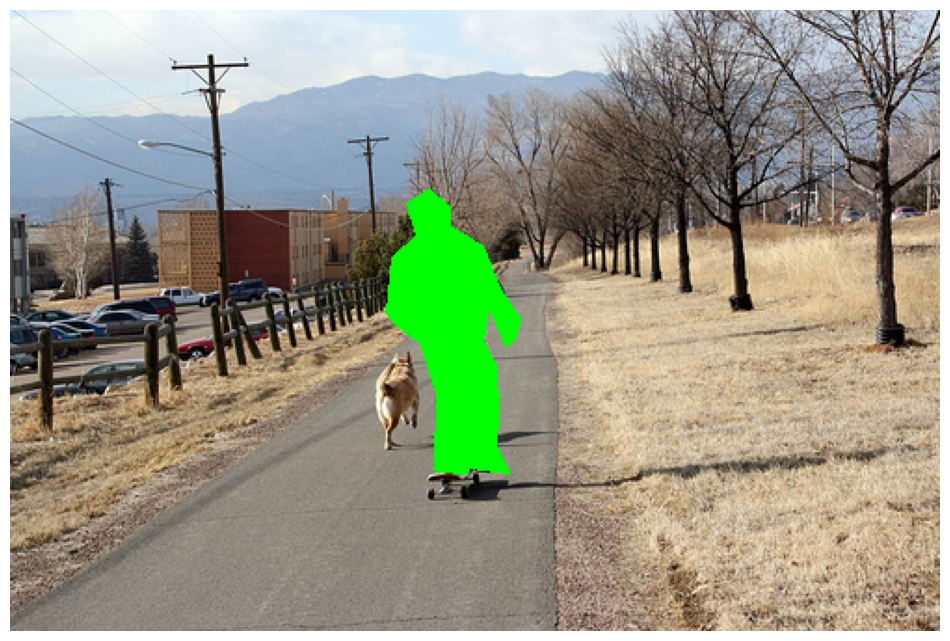

In [41]:
# opencv의 fillPoly를 이용하여 변환된 polygon 좌표 적용하여 instance segmentation 내부 시각화
green_color = (0, 255, 0)

draw_img = image_array.copy()
polygon_xy = np.array(polygon_xy, np.int32) # numpy array로 만들고
draw_img = cv2.fillPoly(draw_img, [polygon_xy], green_color) # 이 ndarray를 리스트로 또 감싸야함

plt.figure(figsize=(12, 14))
plt.imshow(draw_img)
plt.axis('off')

In [42]:
# coco api의 annToMask()를 이용하여 polygon을 mask 형태로 변환
mask = coco.annToMask(anns[2])
print('image shape:', image_array.shape, 'mask shape:', mask.shape)
print('0보다 큰 값이 있는 mask shape:', mask[mask > 0].shape, '0이 있는 mask shape:', mask[mask == 0].shape)
print(mask[mask > 0])

image shape: (334, 500, 3) mask shape: (334, 500)
0보다 큰 값이 있는 mask shape: (6014,) 0이 있는 mask shape: (160986,)
[1 1 1 ... 1 1 1]


(-0.5, 499.5, 333.5, -0.5)

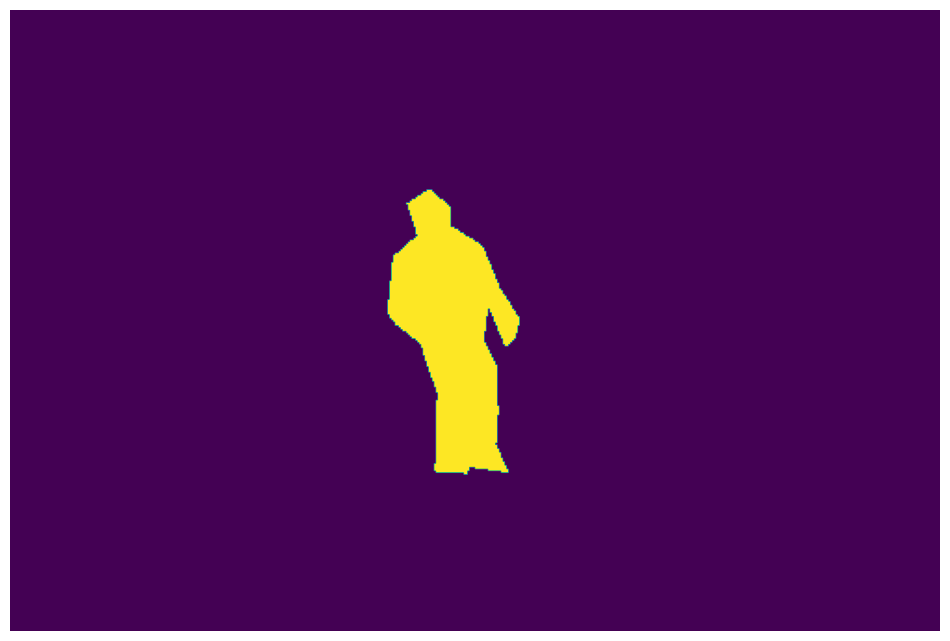

In [43]:
plt.figure(figsize=(12, 14))
plt.imshow(mask)
plt.axis('off')

### Polygon 정보를 mask로 변환하여 Instance Segmentation 시각화
* cv2.fillPoly()로 polygon을 mask형태로 변환.
* layer별 masking 영역에서 0을 제외한 pixel 영역을 layer별 시각화

In [44]:
np.zeros(image_array.shape[0:2])

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

zero_mask shape: (334, 500) mask shape: (334, 500)
masked_polygon 0보다 큰 값: [1. 1. 1. ... 1. 1. 1.]
(6189,) (160811,)


(-0.5, 499.5, 333.5, -0.5)

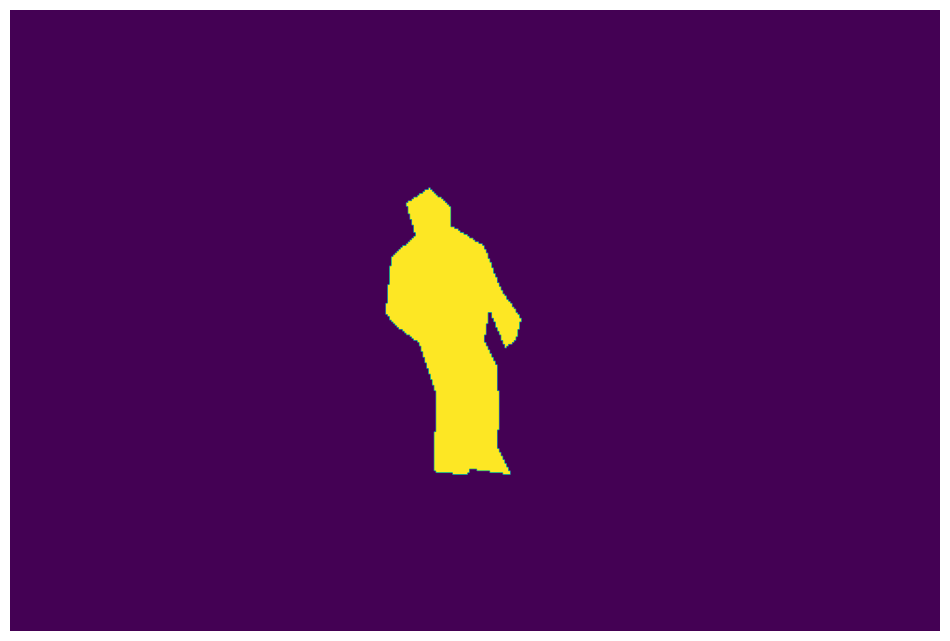

In [45]:
# polygon 정보를 mask 정보로 변환.
#334 x 500 크기의 배경 만들기
zero_mask = np.zeros(image_array.shape[0:2]) # mask 정보는 2차원 선호
masked_polygon = cv2.fillPoly(zero_mask, [polygon_xy], 1)
print('zero_mask shape:', zero_mask.shape, 'mask shape:', masked_polygon.shape)
print('masked_polygon 0보다 큰 값:', masked_polygon[masked_polygon > 0])
print(masked_polygon[masked_polygon > 0].shape, masked_polygon[masked_polygon == 0].shape)

plt.figure(figsize=(12, 14))
plt.imshow(masked_polygon)
plt.axis('off')

In [46]:
# 보통 bool 값으로 masking 정보 제공.
masked_bool = masked_polygon.astype(bool)
print('masked_bool shape:', masked_bool.shape)
print(masked_bool[masked_bool==1].shape, masked_bool[masked_bool==0].shape)
print(masked_bool[masked_bool==1])

masked_bool shape: (334, 500)
(6189,) (160811,)
[ True  True  True ...  True  True  True]


In [47]:
# mask 값에 따라 channel 별로 alpha값을 감안하여 색상 적용
def apply_mask_01(image, mask, color, alpha=0.5):
  for c in range(3):
    image[:, :, c] = np.where(mask == 1, # mask가 1이면
                              image[:, :, c] *
                              (1 - alpha) + alpha * color[c] * 255, # green color를 좀 더 연하게 만듬
                              image[:, :, c]) # mask가 1이 아니면(배경이면)
  return image

(-0.5, 499.5, 333.5, -0.5)

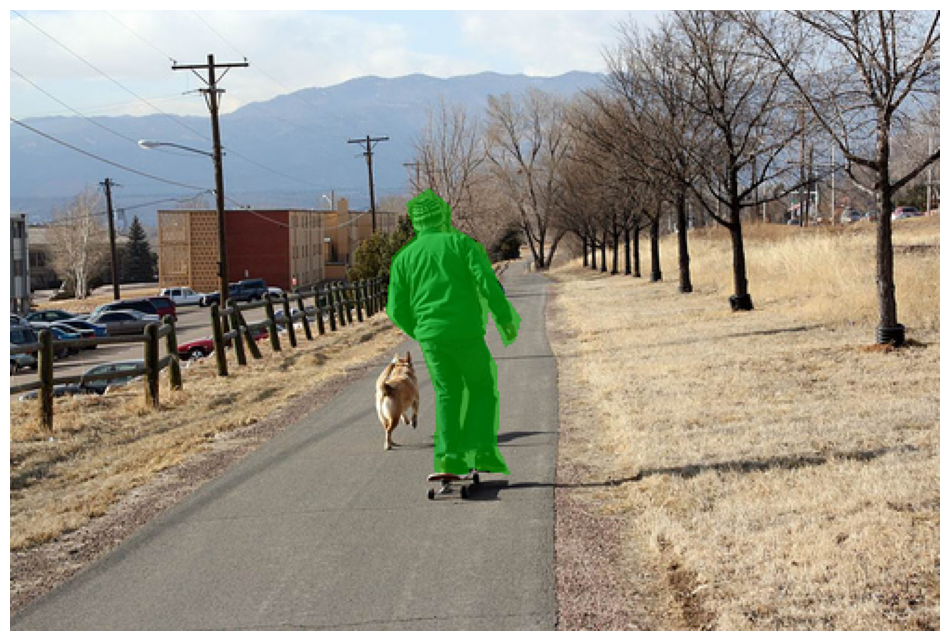

In [48]:
draw_img = image_array.copy()
# masking 정보는 2차원 bool array로 전달.
masked_image = apply_mask_01(draw_img, masked_bool, (0, 255, 0), alpha=0.6)

plt.figure(figsize=(12, 14))
plt.imshow(masked_image)
plt.axis('off')

In [49]:
def apply_mask_02(image, mask, color, alpha=0.5):
  """Apply the given mask to the image.
  """
  image = np.where(mask == 1, color, image)
  return image

In [50]:
np.stack([masked_bool, masked_bool, masked_bool], axis=2).shape

(334, 500, 3)

(-0.5, 499.5, 333.5, -0.5)

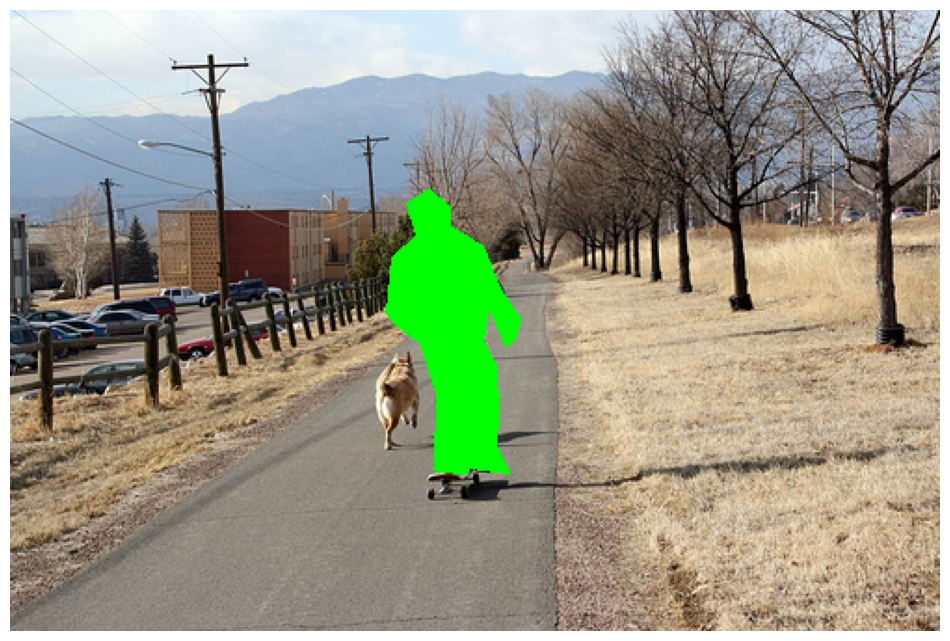

In [51]:
draw_img = image_array.copy()
stacked_mask = np.stack([masked_bool, masked_bool, masked_bool], axis=2) # 채널을 3개로 만들고
masked_image = apply_mask_02(draw_img, stacked_mask, (0, 255, 0)) # 마스킹을 적용할 수도 있음
plt.figure(figsize=(12, 14))
plt.imshow(masked_image)
plt.axis('off')

### bitwise_and 연산으로 오브젝트 영역을 제외하고 나머지 영역은 모두 0 처리하기

In [53]:
masked_image.shape

(334, 500, 3)

(-0.5, 499.5, 333.5, -0.5)

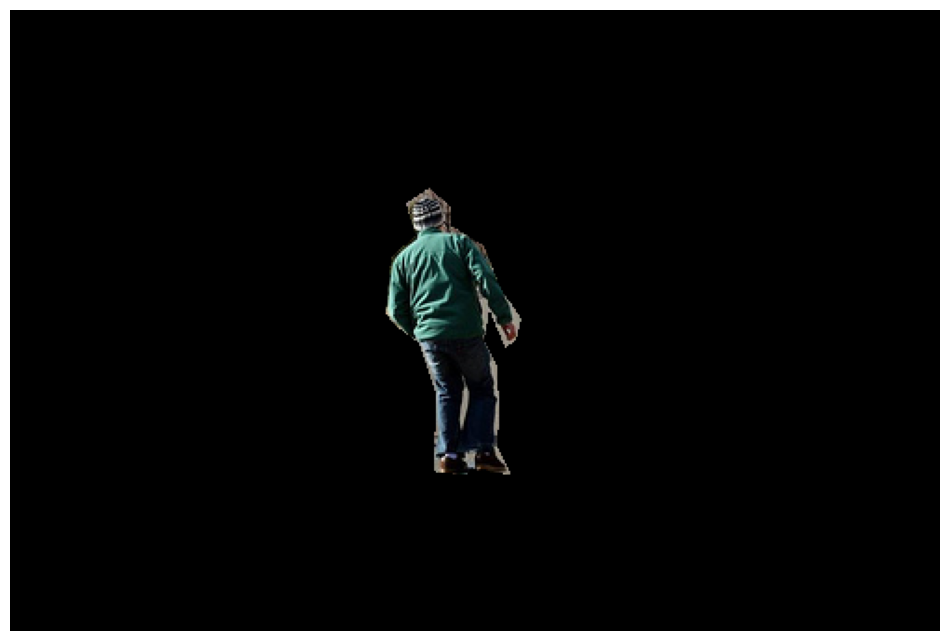

In [52]:
# True는 255로, False는 0으로 변환.
s_mask_int = (masked_bool * 255).astype("uint8")
draw_img = image_array.copy()
# opencv의 bitwise_and()로 masking 255 영역만 object 나타내고, 0 영역은 검은색으로 시각화
only_mask_image = cv2.bitwise_and(draw_img, draw_img, mask=s_mask_int)
plt.figure(figsize=(12, 14))
plt.imshow(only_mask_image)
plt.axis('off')

### Object segmentation의 외곽선 그리기
* opencv의 findContours()와 drawContours()를 이용하여 외곽선을 그림.
* 2차원 masking bool array를 0또는 255 숫자로 변경한 후 findContours()를 적용.
* findContours() 설명은 https://bkshin.tistory.com/entry/OpenCV-22-%EC%BB%A8%ED%88%AC%EC%96%B4Contour 참조

(-0.5, 499.5, 333.5, -0.5)

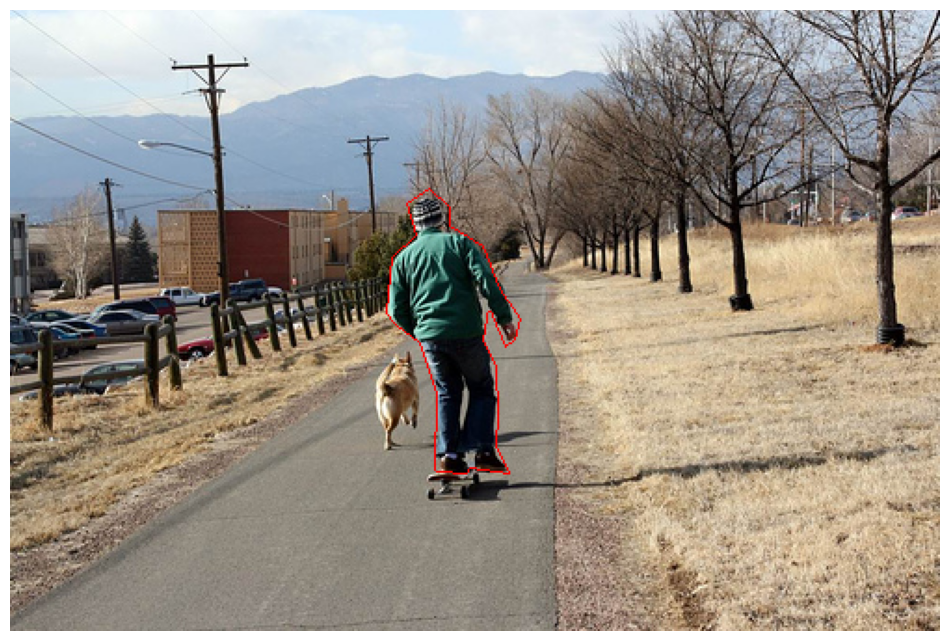

In [54]:
# polygon 좌표가 없을때 mask 정보를 통해 외곽선을 찾는 방법
draw_img = image_array.copy()

s_mask_int = (masked_bool * 255).astype("uint8")
contours, hierarchy = cv2.findContours(s_mask_int, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
masked_image = cv2.drawContours(draw_img, contours, -1, (255, 0, 0), 1, cv2.LINE_8, hierarchy, 100)

plt.figure(figsize=(12, 14))
plt.imshow(masked_image)
plt.axis('off')

### Segmentation 코드 함수화

In [55]:
def get_polygon_xy(ann_seg):
  polygon_x = [x for index, x in enumerate(ann_seg) if index % 2 == 0]
  polygon_y = [x for index, x in enumerate(ann_seg) if index % 2 == 1]
  polygon_xy = [[x, y] for x, y in zip(polygon_x, polygon_y)]
  polygon_xy = np.array(polygon_xy, np.int32)
  return polygon_xy

def get_mask(image_array_shape, polygon_xy):
  mask = np.zeros(image_array_shape)
  masked_polygon = cv2.fillPoly(mask, [polygon_xy], 1) # polygon에 해당하는 좌표값은 모두 1로 채움

  return masked_polygon

def apply_mask(image, mask, color, alpha=0.5):
  for c in range(3):
    image[:, :, c] = np.where(mask == 1,
                              image[:, :, c] *
                              (1 - alpha) + alpha * color[c] * 255,
                              image[:, :, c])
  return image

# ann_seg_list에 있는 object들의 segmentation에 따라 instance segmentation 시각화.
def draw_segment(image_array, ann_seg_list, color_list, alpha):
  draw_image = image_array.copy()
  mask_array_shape = draw_image.shape[0:2]

  # list형태로 입력된 segmentation 정보들을 각각 시각화
  for index, ann_seg in enumerate(ann_seg_list):
    # polygon 좌표로 변환.
    polygon_xy = get_polygon_xy(ann_seg)
    # mask 정보 변환
    masked_polygon = get_mask(mask_array_shape, polygon_xy)

    # segmentation color와 외곽선용 color 선택
    color_object = color_list[np.random.randint(len(color_list))]
    color_contour = color_list[np.random.randint(len(color_list))]
    # masking 적용.
    masked_image = apply_mask(draw_image, masked_polygon, color_object, alpha=0.6)
    # 외곽선 적용.
    s_mask_int = (masked_polygon*255).astype("uint8")
    contours, hierarchy = cv2.findContours(s_mask_int, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    masked_image = cv2.drawContours(masked_image, contours, -1, color_contour, 1, cv2.LINE_8, hierarchy, 100)

  return masked_image


In [56]:
color_list = [
              (0, 255, 0),
              (255, 0, 0),
              (0, 0, 255)
]
anns = coco.loadAnns(annIds)
ann_seg_list = [ann['segmentation'][0] for ann in anns]
print(ann_seg_list)

[[216.7, 211.89, 216.16, 217.81, 215.89, 220.77, 215.89, 223.73, 217.77, 225.35, 219.12, 224.54, 219.12, 220.5, 219.66, 217.27, 219.93, 212.7, 220.46, 207.85, 219.66, 203.01, 218.85, 198.43, 217.77, 195.74, 216.7, 194.93, 215.62, 190.62, 215.62, 186.59, 214.27, 183.89, 211.85, 184.16, 211.85, 187.66, 210.24, 187.66, 209.16, 184.97, 207.81, 183.36, 205.12, 186.59, 205.12, 189.28, 201.08, 192.78, 199.74, 195.2, 196.78, 200.04, 196.51, 203.01, 198.12, 205.43, 197.32, 209.2, 196.78, 213.23, 197.05, 218.89, 199.74, 221.85, 201.62, 225.35, 201.62, 233.69, 201.08, 236.11, 202.97, 236.38, 204.85, 236.11, 204.58, 232.34, 203.78, 228.85, 205.39, 233.15, 207.81, 235.57, 208.62, 234.23, 206.74, 231.27, 205.12, 228.04, 206.74, 222.39, 208.35, 219.96, 210.77, 217.54, 211.85, 221.85, 214.54, 223.73, 212.93, 217.54, 212.93, 215.66, 215.89, 212.96, 216.16, 212.16], [223.48, 251.26, 230.81, 246.74, 234.48, 247.6, 241.8, 247.6, 247.41, 243.72, 248.7, 244.15, 252.15, 249.54, 252.15, 254.71, 249.78, 255.79

(-0.5, 499.5, 333.5, -0.5)

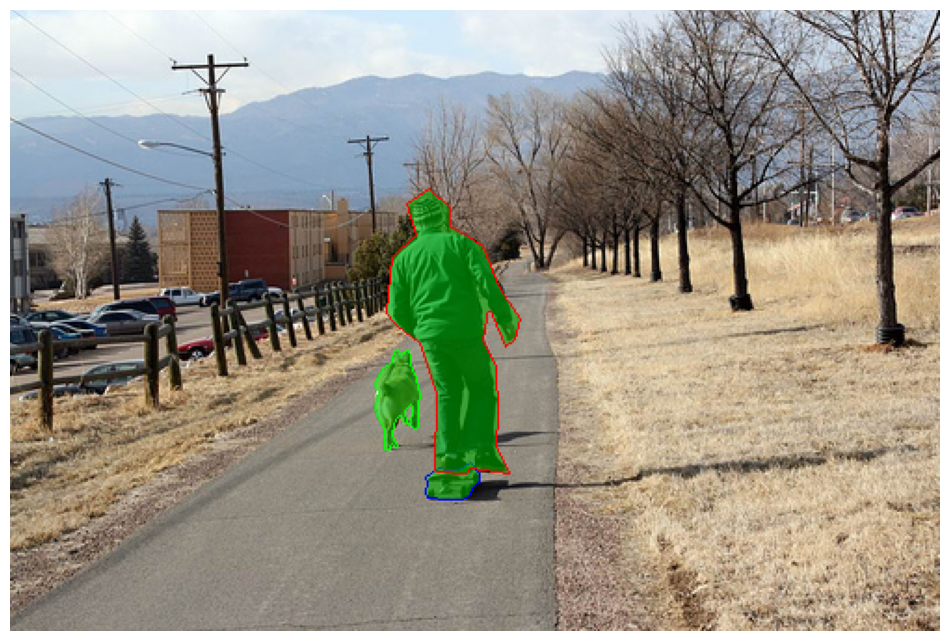

In [57]:
masked_image = draw_segment(image_array, ann_seg_list, color_list, alpha=0.6)
plt.figure(figsize=(12, 14))
plt.imshow(masked_image)
plt.axis('off')